In [1]:
%cd ".."

/home/id1896/python/2A/projet-statistique-2022


In [2]:
from gensim import models
from sklearn.manifold import TSNE
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time

from sklearn import decomposition
from sklearn import preprocessing
from sklearn.cluster import DBSCAN,AgglomerativeClustering, OPTICS
from sklearn.metrics.pairwise import euclidean_distances, manhattan_distances
import mantel
from skbio.stats import distance
import scipy.spatial as sp
import scipy.stats
import random

from word_embedding.distance_wmd import *

In [3]:
#Read WMD matrix 
mat_distance_wmd = lecture_fichier_distances_wmd("distances_cbow.7z")
mat_distance_wmd.head()

In [ ]:
#On considere mat_distance_wmd comme le doc embedding et on calcule la matrice de distance euclidiennes
mat_distance_euclidean = euclidean_distances(mat_distance_wmd)
mat_distance_manhattan = manhattan_distances(mat_distance_wmd)

# Vectoriel Approche

In [ ]:
order = np.inf
mat_distance_wmd_norme = mat_distance_wmd/np.linalg.norm(mat_distance_wmd, ord=order)
mat_distance_euclidean_norme = mat_distance_euclidean/np.linalg.norm(mat_distance_euclidean)

print(f"Norme {order} de la matrice wmd {np.linalg.norm(mat_distance_wmd)}")
print(f"Norme {order} de la matrice euclidiean {np.linalg.norm(mat_distance_euclidean)}")
print(f"Norme {order} des differences {np.linalg.norm(mat_distance_wmd_norme - mat_distance_euclidean_norme)}")

Norme inf de la matrice wmd 2890298.834267834
Norme inf de la matrice euclidiean 115489897.73552825
Norme inf des differences 0.7558681201164121


In [ ]:
mat_distance_wmd_norme 

,0,1,2,3,4,5,6,7,8,9,...,9491,9492,9493,9494,9495,9496,9497,9498,9499,9500
0,0.000000,0.000029,0.000028,0.000036,0.000031,0.000039,0.000031,0.000029,0.000023,0.000060,...,0.000065,0.000035,0.000074,0.000038,0.000026,0.000028,0.000029,0.000031,0.000037,0.000027
1,0.000029,0.000000,0.000008,0.000022,0.000021,0.000035,0.000029,0.000025,0.000012,0.000069,...,0.000069,0.000033,0.000081,0.000040,0.000013,0.000014,0.000015,0.000023,0.000026,0.000011
2,0.000028,0.000008,0.000000,0.000022,0.000022,0.000034,0.000028,0.000023,0.000011,0.000070,...,0.000068,0.000032,0.000080,0.000038,0.000012,0.000014,0.000014,0.000023,0.000025,0.000011
3,0.000036,0.000022,0.000022,0.000000,0.000017,0.000042,0.000033,0.000030,0.000023,0.000071,...,0.000067,0.000043,0.000071,0.000043,0.000018,0.000018,0.000021,0.000017,0.000036,0.000021
4,0.000031,0.000021,0.000022,0.000017,0.000000,0.000037,0.000031,0.000026,0.000021,0.000062,...,0.000064,0.000036,0.000071,0.000037,0.000017,0.000017,0.000021,0.000015,0.000032,0.000018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9496,0.000028,0.000014,0.000014,0.000018,0.000017,0.000034,0.000027,0.000022,0.000014,0.000067,...,0.000064,0.000035,0.000076,0.000036,0.000013,0.000000,0.000017,0.000018,0.000027,0.000014
9497,0.000029,0.000015,0.000014,0.000021,0.000021,0.000035,0.000026,0.000024,0.000016,0.000067,...,0.000064,0.000030,0.000075,0.000036,0.000013,0.000017,0.000000,0.000021,0.000030,0.000013
9498,0.000031,0.000023,0.000023,0.000017,0.000015,0.000041,0.000033,0.000028,0.000022,0.000068,...,0.000064,0.000038,0.000064,0.000040,0.000016,0.000018,0.000021,0.000000,0.000036,0.000020
9499,0.000037,0.000026,0.000025,0.000036,0.000032,0.000028,0.000036,0.000029,0.000027,0.000073,...,0.000068,0.000036,0.000087,0.000042,0.000028,0.000027,0.000030,0.000036,0.000000,0.000024


In [ ]:
# order = 2
# mat_wmd_normalised = mat_distance_wmd/np.linalg.norm(mat_distance_wmd, ord=order,axis=0)
# mat_euclidean_normalised = mat_distance_euclidean/np.linalg.norm(mat_distance_euclidean, ord=order,axis=0)

# sns.displot(np.linalg.norm(mat_wmd_normalised - mat_euclidean_normalised,ord=order,axis=0))
# sp.distance.cdist(mat_distance_wmd,mat_distance_euclidean,metric="cosine")
# mat_distance_euclidean_norme = mat_distance_euclidean/np.linalg.norm(mat_distance_euclidean)

# print(f"Norme {order} de la matrice wmd {np.linalg.norm(mat_distance_wmd)}")
# print(f"Norme {order} de la matrice euclidiean {np.linalg.norm(mat_distance_euclidean)}")
# print(f"Norme {order} des differences {np.linalg.norm(mat_distance_wmd_norme - mat_distance_euclidean_norme)}")

# Mantel test

## Intuition

In [ ]:
nb_prop = mat_distance_wmd.shape[0]
wmd_triu = mat_distance_wmd.values[np.triu_indices(nb_prop)]
euclidiean_triu = mat_distance_euclidean[np.triu_indices(nb_prop)]
manhattan_triu = mat_distance_manhattan[np.triu_indices(nb_prop)]

In [ ]:
print(f"Pearson euclidienne {scipy.stats.pearsonr(wmd_triu,euclidiean_triu)}")
print(f"Pearson {scipy.stats.pearsonr(wmd_triu,manhattan_triu)}")

Pearson (0.813078586876976, 0.0)


In [ ]:
print(f"Spearman euclidienne {scipy.stats.spearmanr(wmd_triu,euclidiean_triu)}")
print(f"Spearman manhattan {scipy.stats.spearmanr(wmd_triu,manhattan_triu)}")

Spearman SpearmanrResult(correlation=0.8104178120765801, pvalue=0.0)


Taille 'population': 45139251
Taille echantillons: 45139


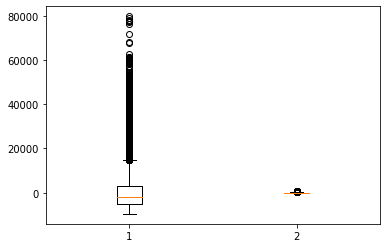

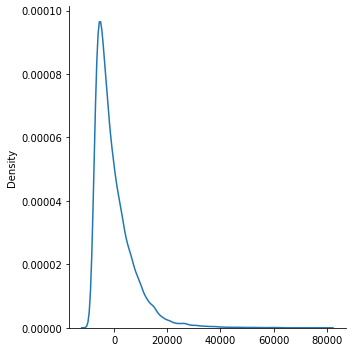

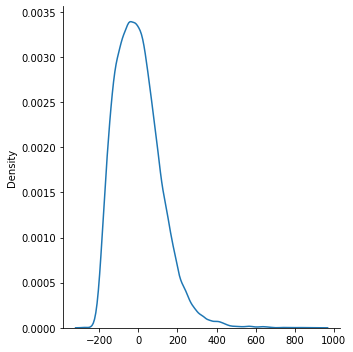

In [ ]:
nb_pt = int(0.001 * len(euclidiean_triu))
print(f"Taille 'population': {len(euclidiean_triu)}\nTaille echantillons: {nb_pt}")
ind_samp = random.sample(range(len(euclidiean_triu)),nb_pt)
eucli_plot = euclidiean_triu[ind_samp] - np.mean(euclidiean_triu[ind_samp])
manhattan_plot = manhattan_triu[ind_samp] - np.mean(manhattan_triu[ind_samp])
wmd_plot = wmd_triu[ind_samp] - np.mean(wmd_triu[ind_samp])

#Boxplot
plt.boxplot([eucli_plot, wmd_plot, manhattan_plot])
plt.show()

#Displot
sns.displot(eucli_plot,kind="kde")
sns.displot(wmd_plot,kind="kde")
sns.displot(manhattan_plot,kind="kde")
plt.show()

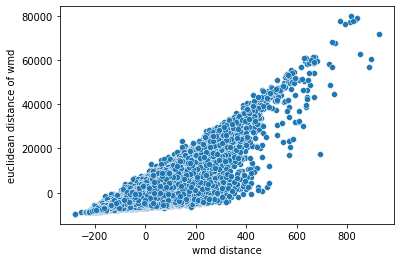

In [ ]:
sns.scatterplot(y=eucli_plot,x=wmd_plot)
plt.xlabel("wmd distance")
plt.ylabel("euclidean distance of wmd")
plt.show()

sns.scatterplot(y=manhattan_plot,x=wmd_plot)
plt.xlabel("wmd distance")
plt.ylabel("manhattan distance of wmd")
plt.show()

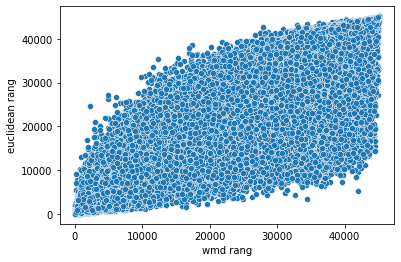

In [ ]:
sns.scatterplot(y=scipy.stats.rankdata(eucli_plot),x=scipy.stats.rankdata(wmd_plot))
plt.xlabel("wmd rang")
plt.ylabel("euclidean rang")
plt.show()


sns.scatterplot(y=scipy.stats.rankdata(manhattan_plot),x=scipy.stats.rankdata(wmd_plot))
plt.xlabel("wmd rang")
plt.ylabel("manhattan rang")
plt.show()


## Size of Matrix

In [ ]:
mantel.test(mat_distance_wmd.iloc[:300,:300],
            mat_distance_euclidean[:300,:300]
            ,perms=999)

(0.8425566740640995, 0.001001001001001001, 16.04880833697031)

In [ ]:
distance.mantel(mat_distance_wmd.iloc[:300,:300],
            mat_distance_euclidean[:300,:300]
            ,permutations=999)

(0.8425566740640985, 0.001, 300)

In [ ]:
list_time_mantel,list_time_scikit = [], []
list_size = [i for i in range(10,300,5)]

for i in list_size:
    print(i,end=" ")
    t0 = time.time()
    mantel.test(mat_distance_wmd.iloc[:i,:i],
                mat_distance_wmd.iloc[:i,:i]
                ,perms=999)
    list_time_mantel.append(time.time() - t0)
    t0 = time.time()
    distance.mantel(mat_distance_wmd.iloc[:i,:i],
                mat_distance_wmd.iloc[:i,:i]
                ,permutations=999)
    list_time_scikit.append(time.time() - t0)

10 15 20 25 30 35 40 45 50 55 60 65 70 75 80 85 90 95 100 105 110 115 120 125 130 135 140 145 150 155 160 165 170 175 180 185 190 195 200 205 210 215 220 225 230 235 240 245 250 255 260 265 270 275 280 285 290 295 

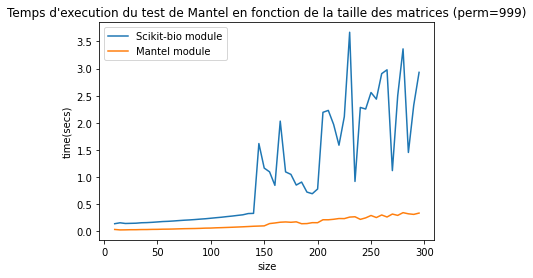

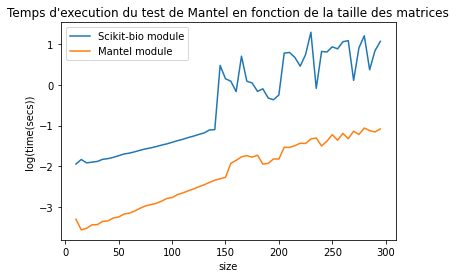

In [ ]:
#Comparaison
plt.plot(list_size,list_time_scikit)
plt.plot(list_size,list_time_mantel)
plt.legend(["Scikit-bio module","Mantel module"])
plt.title("Temps d'execution du test de Mantel en fonction de la taille des matrices (perm=999)")
plt.xlabel("size")
plt.ylabel("time(secs)")
plt.show()

plt.plot(list_size,np.log(list_time_scikit))
plt.plot(list_size,np.log(list_time_mantel))
plt.legend(["Scikit-bio module","Mantel module"])
plt.title("Temps d'execution du test de Mantel en fonction de la taille des matrices")
plt.xlabel("size")
plt.ylabel("log(time(secs))")
plt.show()

In [ ]:
# Focus on scikit-bio function
list_time_scikit = []
list_size = [i for i in range(10,500,5)]
for i in list_size:
    print(i,end=" ")
    t0 = time.time()
    distance.mantel(mat_distance_wmd.iloc[:i,:i],
                mat_distance_wmd.iloc[:i,:i])
    list_time_scikit.append(time.time() - t0)

10 15 20 25 30 35 40 45 50 55 60 65 70 75 80 85 90 95 100 105 110 115 120 125 130 135 140 145 150 155 160 165 170 175 180 185 190 195 200 205 210 215 220 225 230 235 240 245 250 255 260 265 270 275 280 285 290 295 300 305 310 315 320 325 330 335 340 345 350 355 360 365 370 375 380 385 390 395 400 405 410 415 420 425 430 435 440 445 450 455 460 465 470 475 480 485 490 495 

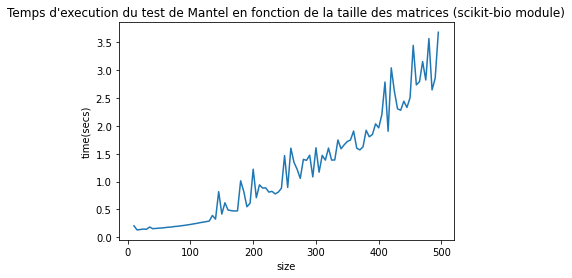

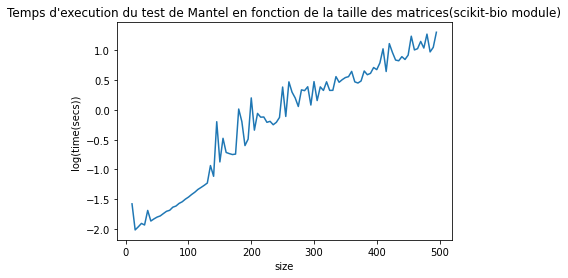

In [ ]:

plt.plot(list_size,list_time_scikit)
plt.title("Temps d'execution du test de Mantel en fonction de la taille des matrices (scikit-bio module)")
plt.xlabel("size")
plt.ylabel("time(secs)")
plt.show()

plt.plot(list_size,np.log(list_time_scikit))
plt.title("Temps d'execution du test de Mantel en fonction de la taille des matrices(scikit-bio module)")
plt.xlabel("size")
plt.ylabel("log(time(secs))")
plt.show()

## Nombre de permutation

In [ ]:
# Focus on scikit-bio function
list_time_scikit = []
list_nbperm = [i for i in range(2,50)]
for i in list_nbperm:
    print(i,end=" ")
    t0 = time.time()
    distance.mantel(mat_distance_wmd,
                    mat_distance_wmd,permutations=i)
    list_time_scikit.append(time.time() - t0)

2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 

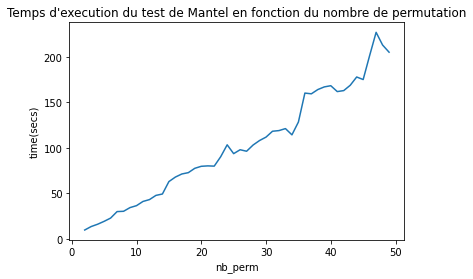

In [ ]:
plt.plot(list_nbperm,list_time_scikit)
plt.title("Temps d'execution du test de Mantel en fonction du nombre de permutation")
plt.xlabel("nb_perm")
plt.ylabel("time(secs)")
plt.show()

In [ ]:
mantel.test(mat_distance_wmd,
                mat_distance_wmd,
                perms=300)

(1.0, 0.0033333333333333335, 17.102981564590042)

In [ ]:
mantel.test(mat_distance_wmd,
                mat_distance_euclidean,
                perms=300)

(0.8130562624786367, 0.0033333333333333335, 17.066133368122976)

In [ ]:
mantel.test(mat_distance_wmd,
                mat_distance_manhattan,
                perms=300)

(0.8130562624786367, 0.0033333333333333335, 17.066133368122976)

In [ ]:
p = 0.003
np.sqrt(p*(1-p)/300)*2

0.006315061361538778

In [ ]:
mantel.test(mat_distance_wmd,
                mat_distance_euclidean,
                method="spearman",
                perms=300)

(0.8102980503210102, 0.0033333333333333335, 17.133198080104442)

In [ ]:
mantel.test(mat_distance_wmd,
                mat_distance_manhattan,
                method="spearman",
                perms=300)

(0.8102980503210102, 0.0033333333333333335, 17.133198080104442)

In [ ]:
import math
from decimal import Decimal
nb_total_perm = math.factorial(mat_distance_wmd.shape[0])
print(f"Nombre total de permutation : {Decimal(nb_total_perm):.1e}")
print("Estimation du nombre d'atomes dans l'univers: 1e+80")

Nombre total de permutation : 8.8e+33668
Estimation du nombre d'atome dans l'univers: 1e+80
